In [15]:
import util.dataloader.IACDataLoader as iac
import numpy as np
import pickle
import os
import nltk
import re
import timeit

from sklearn import preprocessing, svm, metrics
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.externals import joblib

from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

from sklearn.model_selection import cross_val_score

In [16]:
def preprocess(discussion_dict, topic_dict):
    unigram_dict_path = "unigram_dict.pickle"
    discussions_unigram_label_dict_path = "discussions_unigram_label_dict.txt"
    topic_list = sorted(topic_dict.keys())

    print("===== Start preprocessing =====")
    # load stopwords list
    nltk.download('stopwords')
    cachedStopWords = stopwords.words("english")
    # load Porter stemmer
    stemmer = PorterStemmer()

    # Collect unigram list
    unigram_dict = dict()
    if not os.path.exists(unigram_dict_path):
        print("Generate unigram_dict ... ")
        topics = topic_dict.keys()
        for topic in topics:
            print("Start processing topic {}".format(topic))
            discussion_ids = topic_dict[topic]
            idx = 0
            for idx, discussion_id in enumerate(discussion_ids):
                if (idx+1) % 100 == 0:
                    print("{}/{} discussions were processed".format(idx+1, len(discussion_ids)))
                discussion = discussion_dict[discussion_id]
                posts_text = discussion.get_posts_text()
                for post_text in posts_text:
                    # filter chars except words and numbers
                    tmp_text = re.sub(r'[^\w]', ' ', post_text)
                    # filter stopwords and perform Porter stemmer
                    tmp_text = ' '.join([stemmer.stem(word) for word in tmp_text.split() if word not in cachedStopWords])
                    words = tmp_text.split(' ')
                    for word in words:
                        if word in unigram_dict:
                            unigram_dict[word] += 1
                        else:
                            unigram_dict[word] = 1
            print("{}/{} discussions were processed".format(idx+1, len(discussion_ids)))
        pickle.dump(unigram_dict, open(unigram_dict_path, "wb"))
        with open("unigram_dict.txt", "w", encoding='utf-8') as output:
            for key in unigram_dict.keys():
                output.write("{}\t{}\n".format(key, unigram_dict[key]))
    else:
        print("Load unigram_dict ... ")
        unigram_dict = pickle.load(open(unigram_dict_path, "rb"))

    # Generate unigram vector for discussions
    X = []
    y = []
    unigram_list = sorted(unigram_dict.keys())
    with open("unigram_list.txt", "w", encoding='utf-8') as output:
        for u in unigram_list:
            output.write("{}\n".format(u))
    discussions_unigram_label_dict = dict()
    if not os.path.exists(discussions_unigram_label_dict_path):
        print("Generate unigram vector for discussions ...")
        topics = topic_dict.keys()
        for topic in topics:
            print("Start processing topic {}".format(topic))
            discussion_ids = topic_dict[topic]
            idx = 0
            for idx, discussion_id in enumerate(discussion_ids):
                if (idx+1) % 10 == 0:
                    print("{}/{} discussions were processed".format(idx+1, len(discussion_ids)))
                word_dict = dict()
                discussion = discussion_dict[discussion_id]
                posts_text = discussion.get_posts_text()
                for post_text in posts_text:
                    # filter chars except words and numbers
                    tmp_text = re.sub(r'[^\w]', ' ', post_text)
                    # filter stopwords and perform Porter stemmer
                    tmp_text = ' '.join([stemmer.stem(word) for word in tmp_text.split() if word not in cachedStopWords])
                    words = tmp_text.split(' ')
                    for word in words:
                        if word in word_dict:
                            word_dict[word] += 1
                        else:
                            word_dict[word] = 1
                unigram_vec = [0] * len(unigram_list)
                w_keys = word_dict.keys()
                for w_key in w_keys:
                    unigram_vec[unigram_list.index(w_key)] = word_dict[w_key]
                discussions_unigram_label_dict[discussion_id] = [unigram_vec, topic]
            print("{}/{} discussions were processed".format(idx+1, len(discussion_ids)))
        with open("discussions_unigram_label_dict.txt", "w", encoding='utf-8') as output:
            for d_id in discussions_unigram_label_dict.keys():
                vec, label = discussions_unigram_label_dict[d_id]
                vec_str = ','.join([str(v) for v in vec])
                output.write("{},{},{}\n".format(d_id, label, vec_str))

        with open("discussions_unigram_label_dict.txt", "r", encoding='utf-8') as f:
            idx = 0
            for idx, line in enumerate(f):
                if (idx+1)%1000 == 0:
                    print("{} discussions were loaded".format(idx+1))
                # if idx>=300:
                #     break
                items = line.strip().split(',')
                X.append(items[2:])
                y.append(topic_list.index(items[1]))
            print("{} discussions were loaded".format(idx))
    else:
        print("Load discussions_unigram_label_dict ... ")
        with open("discussions_unigram_label_dict.txt", "r", encoding='utf-8') as f:
            idx = 0
            for idx, line in enumerate(f):
                if (idx+1)%1000 == 0:
                    print("{} discussions were loaded".format(idx+1))
                # if idx>=300:
                #     break
                items = line.strip().split(',')
                X.append(items[2:])
                y.append(topic_list.index(items[1]))
            print("{} discussions were loaded".format(idx))

    print("===== Done! =====")

    return X, y

In [17]:
dataloader = iac.IACDataLoader()
dataloader.set_dataset_dir("dataset/discussions")
dataloader.set_topic_filepath("dataset/topic.csv")
dataloader.set_stance_filepath("dataset/author_stance.csv")
dataloader.load()

Loading dataset files...
5000 dicussions were loaded
10000 dicussions were loaded
11799 dicussions were loaded
Loading topic file...
Loading author stance file...


In [18]:
topic_dict = dataloader.get_topic_dict()
discussion_dict = dataloader.get_discussion_dict()
author_stance_dict = dataloader.get_author_stance_dict()
topic_list = sorted(topic_dict.keys())

In [19]:
discussion_dict

{'75': <util.dataloader.Discussion.Discussion at 0x7f679c575630>,
 '6945': <util.dataloader.Discussion.Discussion at 0x7f679808ca90>,
 '8612': <util.dataloader.Discussion.Discussion at 0x7f679b64f160>,
 '2022': <util.dataloader.Discussion.Discussion at 0x7f6796009358>,
 '2985': <util.dataloader.Discussion.Discussion at 0x7f67953ae438>,
 '10359': <util.dataloader.Discussion.Discussion at 0x7f679cbc3940>,
 '1024': <util.dataloader.Discussion.Discussion at 0x7f679cccf0b8>,
 '14813': <util.dataloader.Discussion.Discussion at 0x7f679bac9a20>,
 '7569': <util.dataloader.Discussion.Discussion at 0x7f679577ff60>,
 '210': <util.dataloader.Discussion.Discussion at 0x7f6795b2c940>,
 '2813': <util.dataloader.Discussion.Discussion at 0x7f67980257b8>,
 '2380': <util.dataloader.Discussion.Discussion at 0x7f67999099b0>,
 '8544': <util.dataloader.Discussion.Discussion at 0x7f67989b1f98>,
 '4885': <util.dataloader.Discussion.Discussion at 0x7f6794d03d68>,
 '11024': <util.dataloader.Discussion.Discussion 

In [20]:
discussion_dict = dataloader.get_discussion_dict()
author_stance_dict = dataloader.get_author_stance_dict()
topic_list = sorted(topic_dict.keys())

In [21]:
X, y = preprocess(discussion_dict, topic_dict)

===== Start preprocessing =====
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/qiaofei/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
Load unigram_dict ... 
Load discussions_unigram_label_dict ... 
1000 discussions were loaded
2000 discussions were loaded
2865 discussions were loaded
===== Done! =====


In [22]:
X

[['0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',
  '0',

In [24]:
from sklearn.manifold import TSNE

In [48]:
X_tsne = TSNE(n_components=2,learning_rate=100).fit_transform(X)

In [43]:
from sklearn.decomposition import PCA
X_pca = PCA(n_components = 2).fit_transform(X)

In [44]:
X_pca

array([[-221.57886178,    8.89487338],
       [ -87.45751084,    9.02926414],
       [ 847.97520648, -220.6896196 ],
       ..., 
       [-106.02032787,  -35.78812792],
       [-219.07161977,    9.37107172],
       [ 202.45938571,  -60.81656936]])

In [28]:
len(X_tsne)

2866

In [29]:
len(X_pca)

2866

In [22]:
with open("y.txt", "w", encoding = 'utf-8') as output:
    output.write(str(y))

In [30]:
import matplotlib.pyplot as plt

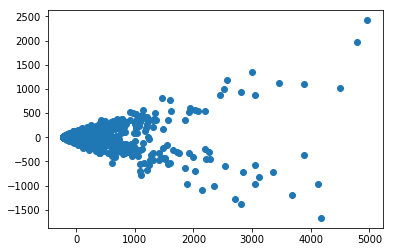

In [45]:
plt.scatter(X_pca[:, 0],X_pca[:, 1])
plt.show()

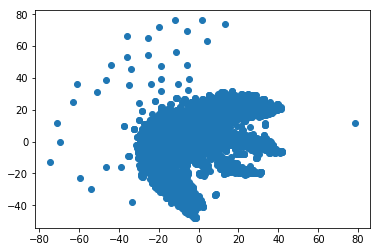

In [42]:
plt.scatter(X_tsne[:, 0],X_tsne[:, 1])
plt.show()

In [ ]:
with open("X_pca.txt", "w") as output:
        output.write(str(X_pca))

In [11]:
with open("X_pca.txt", "r") as f:
    X_pca = []
    for item in f:
        X_pca.append(item.strip())
    print(X_pca)

['[[-14.43013954  -6.30293131]', '[ 16.13416672  -0.8772375 ]', '[ 32.319767    16.95057487]', '...,', '[-24.63249397  24.37234306]', '[-11.20993519 -15.41804504]', '[ 26.6813488   12.66603565]]']


In [39]:
    print("Divide data into train/test sets")
    X_train, X_test, y_train, y_test = train_test_split(X_tsne, y, stratify=y, test_size=0.25)
    svm_model_path = "svm_model.pkl"
    clf = None
    if not os.path.exists(svm_model_path):
        print("Initialize SVM model")
        clf = svm.SVC(kernel='linear', C=1)
        print("Fit the model")
        clf.fit(X_train, y_train)
        print("Accuracy of testing data: {}".format(clf.score(X_test, y_test)))
        print("Dump the model...")
        joblib.dump(clf, open(svm_model_path, "wb"))
        print("Done!")
    else:
        print("Load pre-trained SVM model")
        clf = joblib.load(open(svm_model_path, "rb"))
        # clf = svm.SVC(kernel='linear', C=1)
        if clf:
            scores = cross_val_score(clf, X_tsne, y, cv=5)
            print("5-fold cross validation: {}".format(scores))
            with open("task1.csv", "w") as output:
                output.write("{},{}\n".format(",".join([str(s) for s in scores]), np.mean(scores)))

Divide data into train/test sets
Initialize SVM model
Fit the model
Accuracy of testing data: 0.7824267782426778
Dump the model...
Done!


In [46]:
    print("Divide data into train/test sets")
    X_train, X_test, y_train, y_test = train_test_split(X_pca, y, stratify=y, test_size=0.25)
    svm_model_path = "svm_model.pkl"
    clf = None
    if not os.path.exists(svm_model_path):
        print("Initialize SVM model")
        clf = svm.SVC(kernel='linear', C=1)
        print("Fit the model")
        clf.fit(X_train, y_train)
        print("Accuracy of testing data: {}".format(clf.score(X_test, y_test)))
        print("Dump the model...")
        joblib.dump(clf, open(svm_model_path, "wb"))
        print("Done!")
    else:
        print("Load pre-trained SVM model")
        clf = joblib.load(open(svm_model_path, "rb"))
        # clf = svm.SVC(kernel='linear', C=1)
        if clf:
            scores = cross_val_score(clf, X_pca, y, cv=5)
            print("5-fold cross validation: {}".format(scores))
            with open("task1.csv", "w") as output:
                output.write("{},{}\n".format(",".join([str(s) for s in scores]), np.mean(scores)))

Divide data into train/test sets
Initialize SVM model
Fit the model
Accuracy of testing data: 0.599721059972106
Dump the model...
Done!
